In [ ]:
!pip install -U -q segmentation-models
!pip install -q tensorflow
!pip install -q keras
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.6 MB/s eta 0:00:00
Segmentation Models: using `tf.keras` framework.


In [ ]:
#import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm.notebook import tqdm_notebook, tnrange
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from tensorflow.keras.layers import concatenate,add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import img_to_array,load_img,array_to_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.utils import class_weight
from keras.utils import normalize
from keras.metrics import MeanIoU
import segmentation_models as sm

import glob

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/My Drive/Dataset_Capstone/test.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/test.zip
   creating: test/
   creating: test/SS_EA001/
  inflating: __MACOSX/test/._SS_EA001  
  inflating: test/.DS_Store          
  inflating: __MACOSX/test/._.DS_Store  
   creating: test/SS_EA041/
  inflating: __MACOSX/test/._SS_EA041  
   creating: test/SS_EA025/
  inflating: __MACOSX/test/._SS_EA025  
   creating: test/SS_EA034/
   creating: test/SS_EA002/
  inflating: __MACOSX/test/._SS_EA002  
  inflating: test/SS_EA001/EA_001_VarFat_293_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_293_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_290_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_290_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_280_img.png  

In [ ]:
!unzip "/content/drive/My Drive/Dataset_Capstone/train_local.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/train_local.zip
   creating: train_local/
   creating: train_local/SS_EA031/
  inflating: train_local/.DS_Store   
  inflating: __MACOSX/train_local/._.DS_Store  
   creating: train_local/SS_045/
   creating: train_local/EA036_SS/
   creating: train_local/SS/
   creating: train_local/SS_EA_050/
   creating: train_local/SS_3/
   creating: train_local/SS_EA026/
  inflating: train_local/SS_EA031/EA031_860_img.png  
  inflating: train_local/SS_EA031/EA031_908_img.png  
  inflating: train_local/SS_EA031/EA031_815_mask.png  
  inflating: train_local/SS_EA031/EA031_779_mask.png  
  inflating: train_local/SS_EA031/EA031_767_img.png  
  inflating: train_local/SS_EA031/EA031_812_img.png  
  inflating: train_local/SS_EA031/EA031_887_mask.png  
  inflating: train_local/SS_EA031/EA031_863_mask.png  
  inflating: train_local/SS_EA031/EA031_884_img.png  
  inflating: train_local/SS_EA031/EA031_923_mask.png  
  inflating: train_local/SS_EA031/EA031_91

In [ ]:
def count_img(root, total, folders, total_count, text):
    for filename in tqdm(os.listdir(root)):
        if filename != ".DS_Store":
            folders.append(filename)
            ids = next(os.walk(root+'/'+filename))[2]# list of names all images in the given path
            total_count.append(len(ids))
            total +=len(ids)
    print(text)
    print("Number of images and masks = ", total)
    print("The folders containing images and masks are :", folders)
    print("Image tally accordingly :", total_count)
    return total, folders, total_count

In [ ]:
def mac_equalizer(total_count):
    for i in range(len(total_count)):
        if total_count[i] % 2 != 0 :
            total_count[i] -= 1
    print("New count is :", total_count)
    print("New total = ", sum(total_count))
    return total_count,sum(total_count)

In [ ]:
def label_maker(masks):
  labelencoder = LabelEncoder()
  n, h, w, _ = masks.shape
  masks_reshaped = masks.reshape(-1,1)
  masks_reshaped_encoded = labelencoder.fit_transform(masks_reshaped)
  masks_encoded_original_shape = masks_reshaped_encoded.reshape(n, h, w)
  masks_input = np.expand_dims(masks_encoded_original_shape, axis=3)
  print(np.unique(masks_encoded_original_shape), masks_input.shape)
  return masks_input, masks_reshaped_encoded

In [ ]:
def expand_greyscale_image_channels(grey_image_arr):
  #grey_image_arr = np.array(grey_image)
  #grey_image_arr = np.expand_dims(grey_image_arr, -1)
  grey_image_arr_3_channel = grey_image_arr.repeat(3, axis=-1)
  return grey_image_arr_3_channel

In [ ]:
def upload(root, folders, X, y, text):
    count_img = 0
    count_mask = 0
    
    print(text)
    
    for file in folders : 
        image_dir_path = root+ "/" +file
        mask_dir_path =  root+ "/" +file
        
        for img_path in tqdm(sorted(glob.glob(os.path.join(image_dir_path, "*_img.png")))):
            img = load_img(img_path, color_mode = "grayscale")
            img = img_to_array(img)
            img = resize(img, (224, 224, 1), mode = 'constant', preserve_range = True)
            img = img/255.0
            img = expand_greyscale_image_channels(img)
            X[count_img]=img 
            count_img+=1
        print("Image upload count = ", count_img)
        
        
        for mask_path in tqdm(sorted(glob.glob(os.path.join(mask_dir_path, "*_mask.png")))):
            mask = load_img(mask_path, color_mode = "grayscale")
            mask = img_to_array(mask)
            mask = resize(mask, (224, 224, 1), mode = 'constant', preserve_range = True)
            mask = mask/255.0
            y[count_mask]=mask
            count_mask+=1
        print("Mask upload count = ", count_mask)
    return X,y

In [ ]:
def pre_visualize(X, y, text, ix = None) :
    
    print(text)
    for i in range(5) : 
        if ix == None :
            ix = random.randint(0, len(X)-1)
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 15))
        ax1.imshow(X[ix], cmap = 'gray', interpolation = 'bilinear')
        ax1.set_title('Image')
        
        ax2.imshow(y[ix], cmap = 'gray', interpolation = 'bilinear')
        ax2.set_title('Mask')
        ix = None

In [ ]:
train_text = "\t\t\t\t\t\tTraining "
valid_text = "\t\t\t\t\t\tValidation "
test_text = "\t\t\t\t\t\t\tTesting "
train_total = 0
test_total = 0
train_total_count = []
test_total_count = []
train_folders = []
test_folders = []
train_root = "train_local"
test_root = "test"

train_total, train_folders, train_total_count = count_img(train_root, train_total, train_folders, train_total_count, "Training")
test_total, test_folders, test_total_count = count_img(test_root, test_total, test_folders, test_total_count, "Testing")


100%|██████████| 8/8 [00:00<00:00, 1791.67it/s]


Training
Number of images and masks =  457
The folders containing images and masks are : ['SS_3', 'SS_EA026', 'SS', 'EA036_SS', 'SS_045', 'SS_EA_050', 'SS_EA031']
Image tally accordingly : [42, 43, 63, 45, 56, 51, 157]


100%|██████████| 6/6 [00:00<00:00, 14201.93it/s]

Testing
Number of images and masks =  54
The folders containing images and masks are : ['SS_EA041', 'SS_EA002', 'SS_EA001', 'SS_EA025', 'SS_EA034']
Image tally accordingly : [10, 11, 10, 10, 13]


In [ ]:
train_total_count, train_total = mac_equalizer(train_total_count)
test_total_count, test_total = mac_equalizer(test_total_count)

New count is : [42, 42, 62, 44, 56, 50, 156]
New total =  452
New count is : [10, 10, 10, 10, 12]
New total =  52


In [ ]:
im_width = 224
im_height = 224
n_classes = 5 

X = np.zeros((int(train_total/2), im_height, im_width, 3), dtype=np.float32)
y = np.zeros((int(train_total/2), im_height, im_width, 1), dtype=np.float32)

X_test = np.zeros((int(test_total/2), im_height, im_width, 3), dtype=np.float32)
y_test = np.zeros((int(test_total/2), im_height, im_width, 1), dtype=np.float32)

In [ ]:
X, y = upload(train_root, train_folders, X, y, train_text)

						Training 


100%|██████████| 21/21 [00:00<00:00, 73.92it/s]


Image upload count =  21


100%|██████████| 21/21 [00:00<00:00, 89.25it/s]


Mask upload count =  21


100%|██████████| 21/21 [00:00<00:00, 74.73it/s]


Image upload count =  42


100%|██████████| 21/21 [00:00<00:00, 92.89it/s]


Mask upload count =  42


100%|██████████| 31/31 [00:00<00:00, 50.28it/s]


Image upload count =  73


100%|██████████| 31/31 [00:00<00:00, 59.26it/s]


Mask upload count =  73


100%|██████████| 22/22 [00:00<00:00, 47.14it/s]


Image upload count =  95


100%|██████████| 22/22 [00:00<00:00, 60.30it/s]


Mask upload count =  95


100%|██████████| 28/28 [00:00<00:00, 45.89it/s]


Image upload count =  123


100%|██████████| 28/28 [00:00<00:00, 59.32it/s]


Mask upload count =  123


100%|██████████| 25/25 [00:00<00:00, 47.73it/s]


Image upload count =  148


100%|██████████| 25/25 [00:00<00:00, 74.70it/s]


Mask upload count =  148


100%|██████████| 78/78 [00:00<00:00, 78.28it/s]


Image upload count =  226


100%|██████████| 78/78 [00:00<00:00, 95.05it/s]

Mask upload count =  226


In [ ]:
X_test, y_test = upload(test_root, test_folders, X_test, y_test, test_text)

							Testing 


100%|██████████| 5/5 [00:00<00:00, 79.02it/s]


Image upload count =  5


100%|██████████| 5/5 [00:00<00:00, 95.65it/s]


Mask upload count =  5


100%|██████████| 5/5 [00:00<00:00, 82.60it/s]


Image upload count =  10


100%|██████████| 5/5 [00:00<00:00, 85.74it/s]


Mask upload count =  10


100%|██████████| 5/5 [00:00<00:00, 80.04it/s]


Image upload count =  15


100%|██████████| 5/5 [00:00<00:00, 87.28it/s]


Mask upload count =  15


100%|██████████| 5/5 [00:00<00:00, 73.94it/s]


Image upload count =  20


100%|██████████| 5/5 [00:00<00:00, 83.41it/s]


Mask upload count =  20


100%|██████████| 6/6 [00:00<00:00, 72.36it/s]


Image upload count =  26


100%|██████████| 6/6 [00:00<00:00, 89.42it/s]

Mask upload count =  26


In [ ]:
X_test.shape

(26, 224, 224, 3)

In [ ]:
np.unique(y)

array([0.0000000e+00, 1.6891534e-13, 3.4051185e-13, ..., 9.9999988e-01,
       9.9999994e-01, 1.0000000e+00], dtype=float32)

In [ ]:
y.shape

(226, 224, 224, 1)

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size = 0.8, random_state = 0)

In [ ]:
len(X_train)

180

In [ ]:
len(X_valid)

46

						Training 


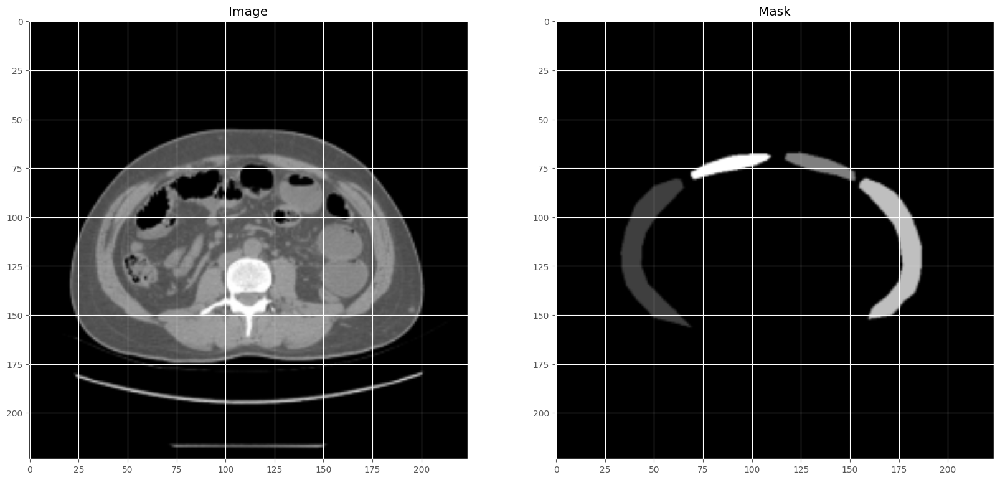

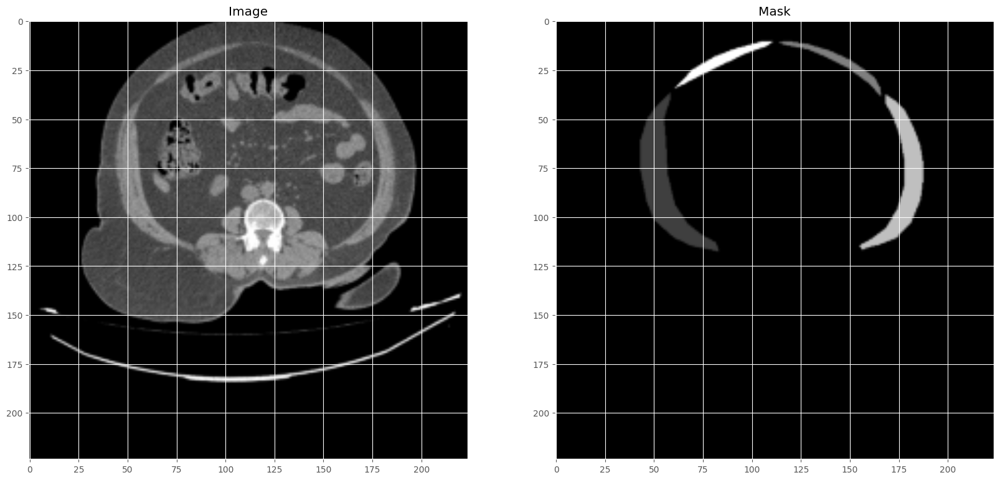

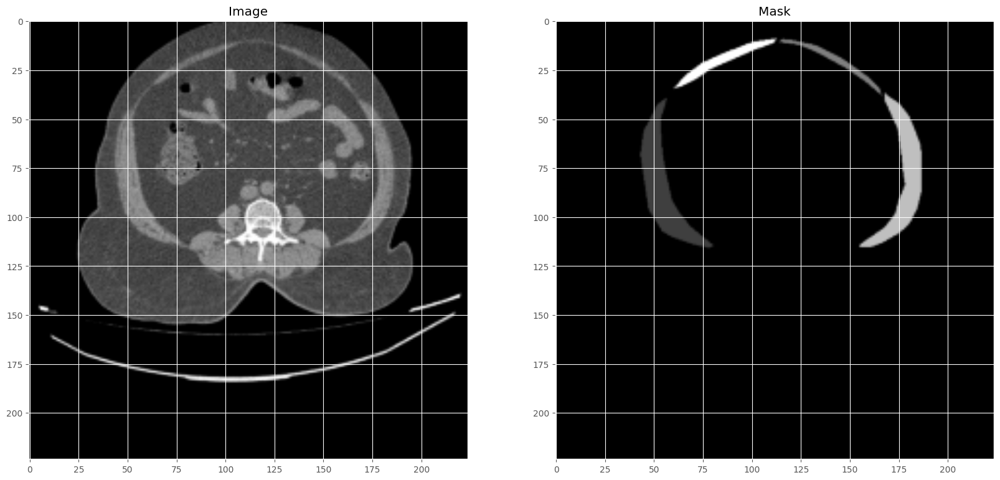

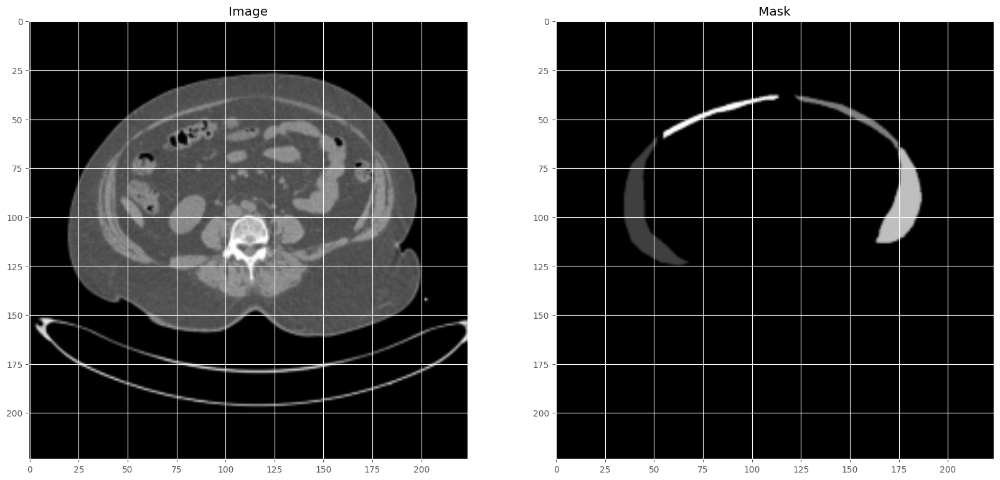

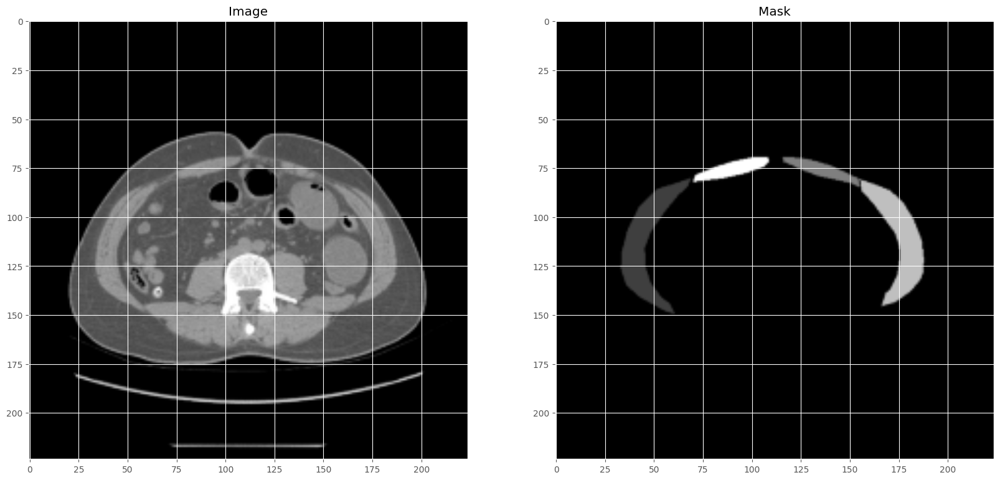

In [ ]:
pre_visualize(X_train, y_train, train_text)

						Validation 


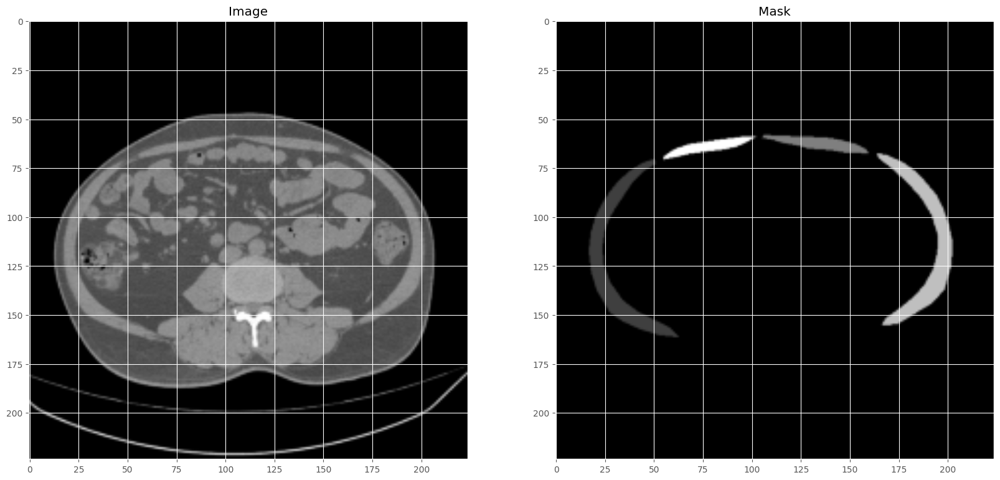

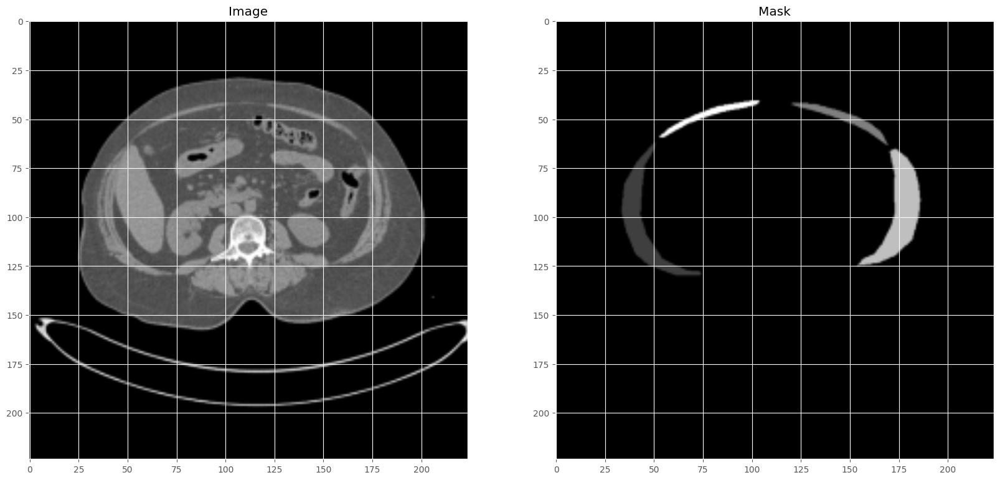

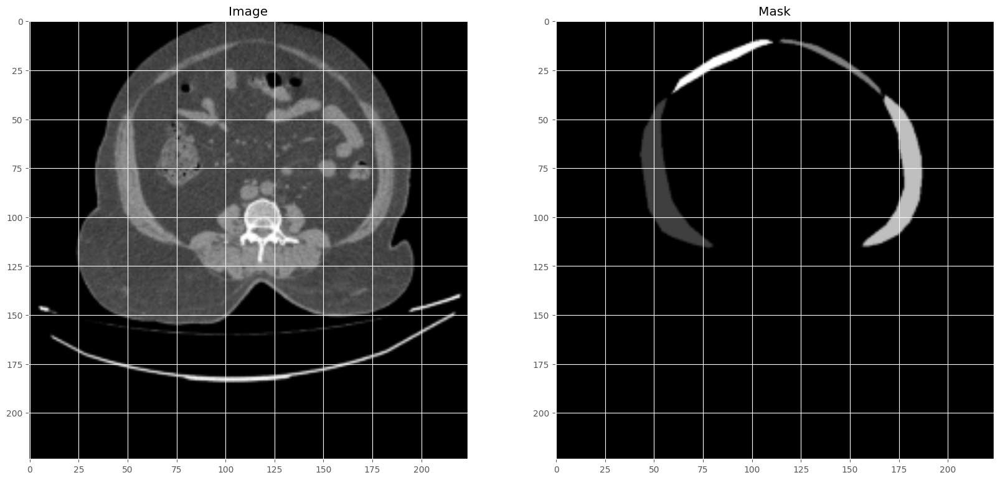

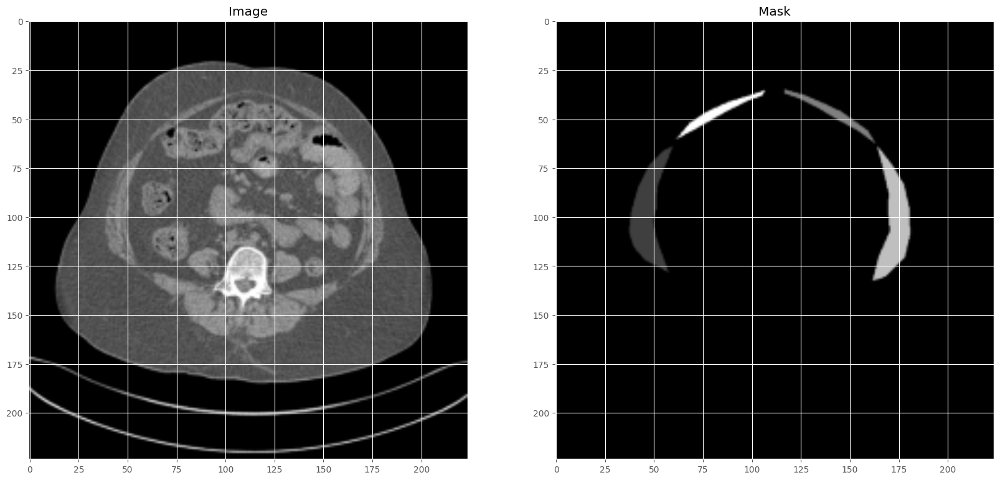

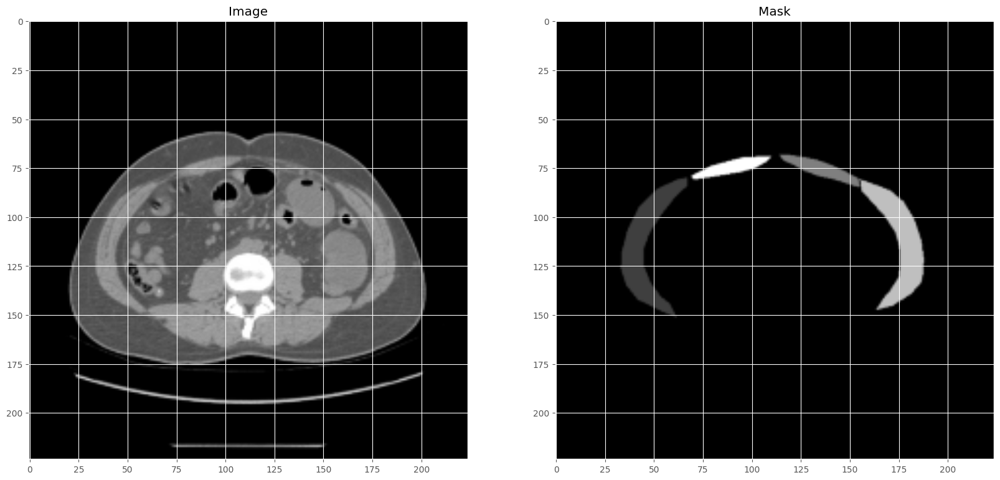

In [ ]:
pre_visualize(X_valid, y_valid, valid_text)

							Testing 


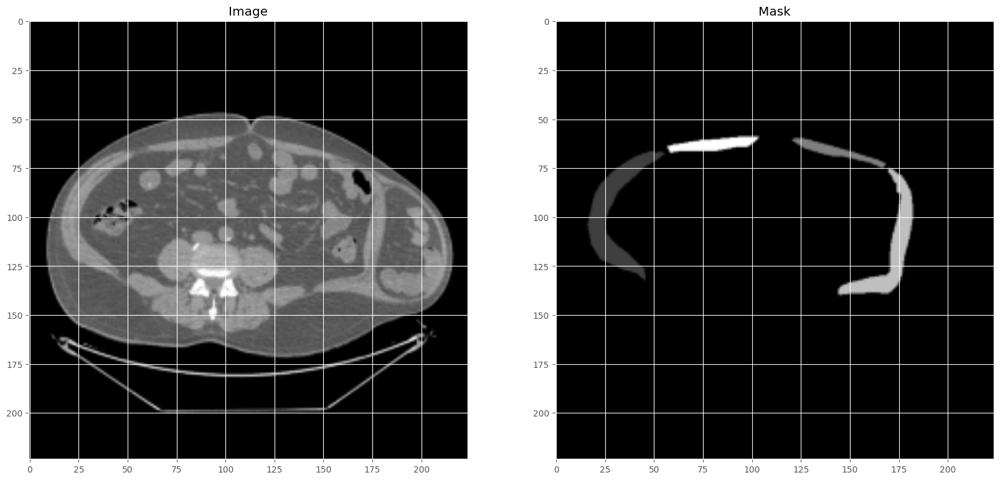

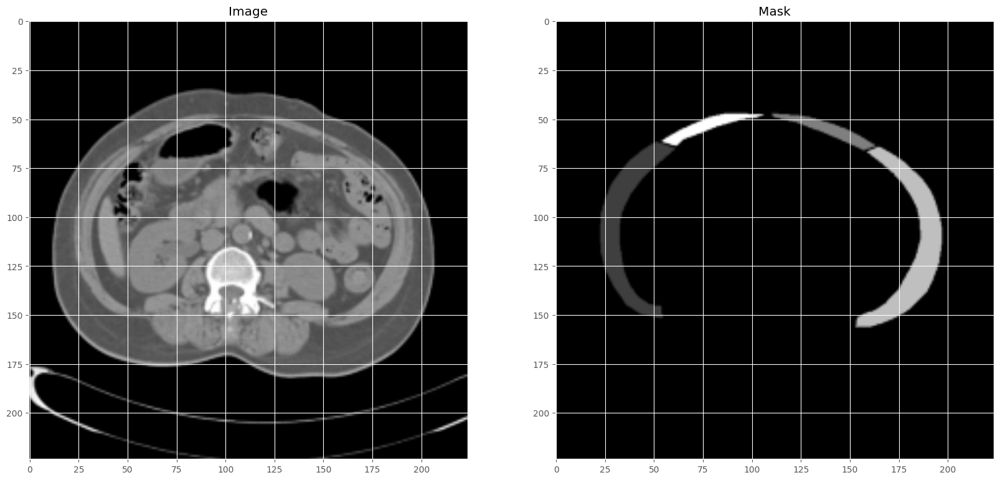

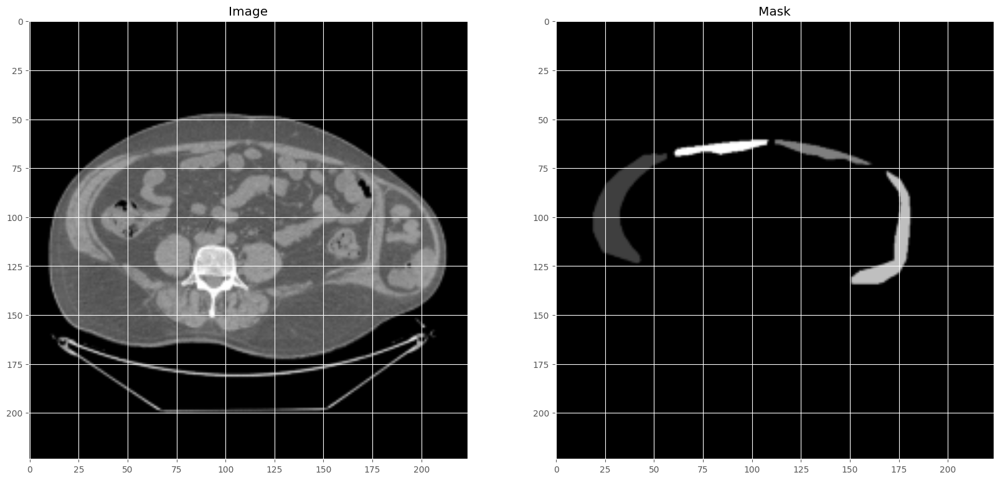

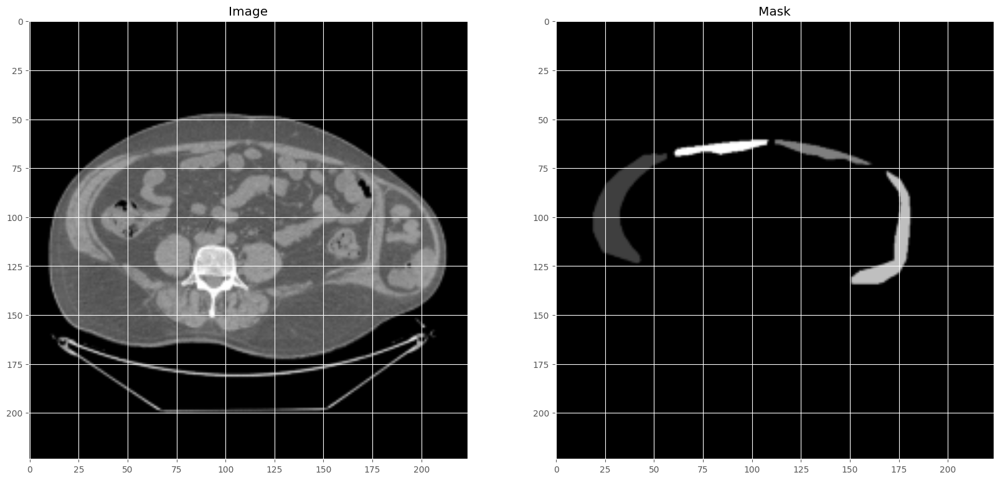

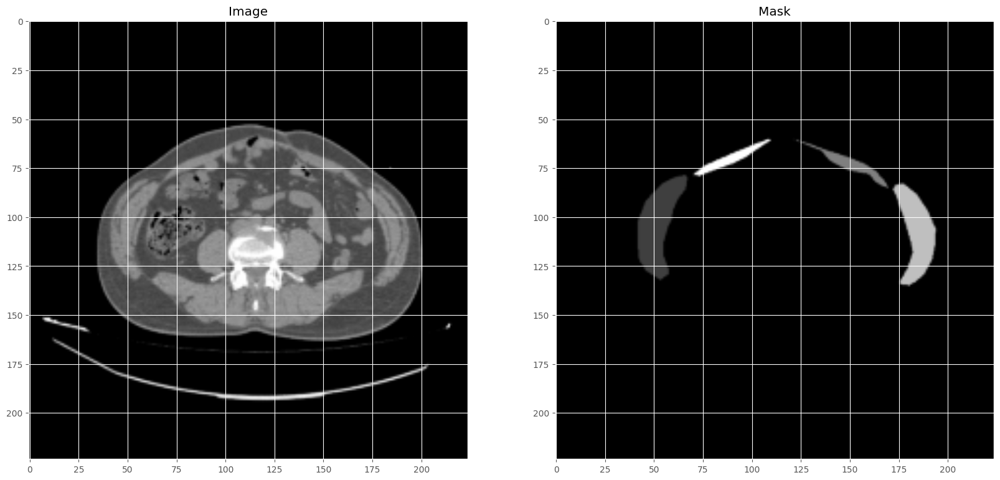

In [ ]:
pre_visualize(X_test, y_test, test_text)

In [ ]:
#Reused parameters in all models

n_classes=5
activation='softmax'

LR = 0.0001


# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)

#dice_loss = sm.losses.DiceLoss(class_weights=np.array(class_weights)) 

#focal_loss = sm.losses.CategoricalFocalLoss()
#total_loss = dice_loss + (1 * focal_loss)

#total_loss = sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]


In [ ]:
from keras import backend as K


def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f* y_pred_f)
    val = (2. * intersection + K.epsilon()) / (K.sum(y_true_f * y_true_f) + K.sum(y_pred_f * y_pred_f) + K.epsilon())
    return 1. - val

In [ ]:
from segmentation_models import Unet

###Model 1
BACKBONE_RESNET = 'seresnet34'
preprocess_input = sm.get_preprocessing(BACKBONE_RESNET)

# preprocess input
X_train_VGG = preprocess_input(X_train)
X_valid_VGG = preprocess_input(X_valid)
#X_test_VGG = preprocess_input(X_test)

#Output
#y_train_VGG = preprocess_input(y_train)
#y_valid_VGG = preprocess_input(y_valid)
#y_test_VGG = preprocess_input(y_test)

N = X_train.shape[-1]
# define model
model_Inc = Unet(backbone_name='seresnet34', encoder_weights=None, input_shape=(224, 224, N))

# compile keras model with defined optimozer, loss and metrics
model_Inc.compile(optimizer=Adam(), loss =  dice_loss, metrics='accuracy')

#model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model_Inc.summary())


Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 224, 224, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)                 (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']   

Training


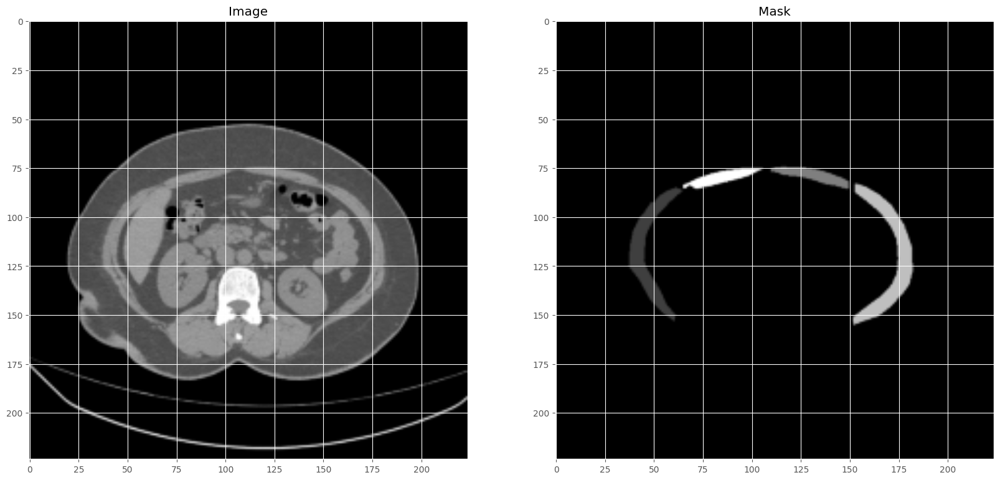

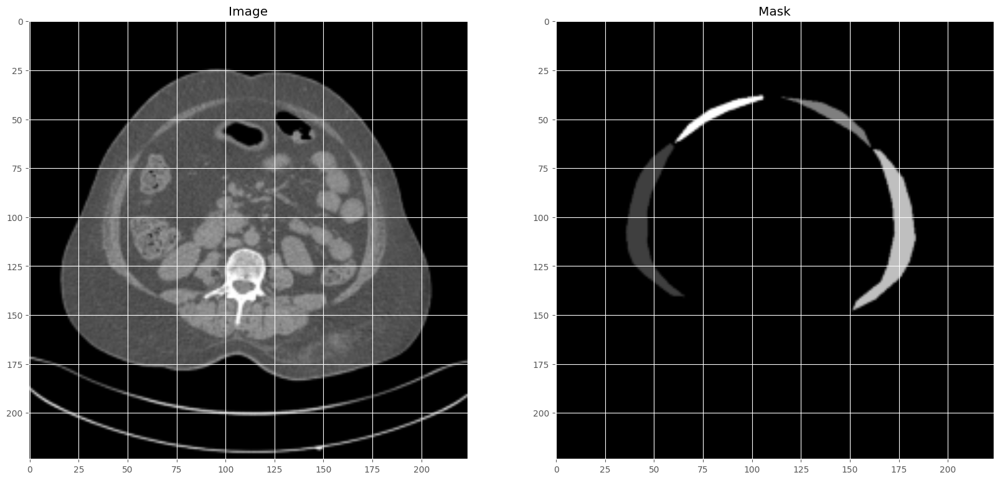

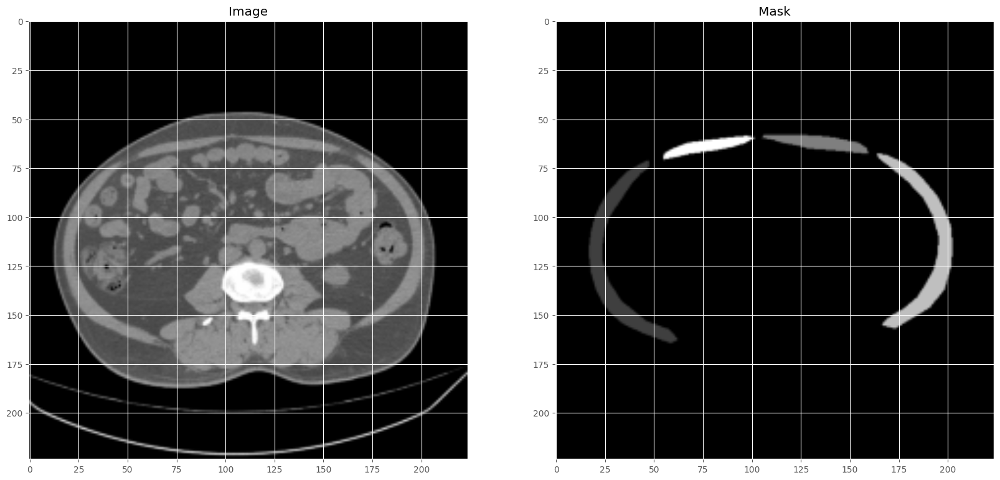

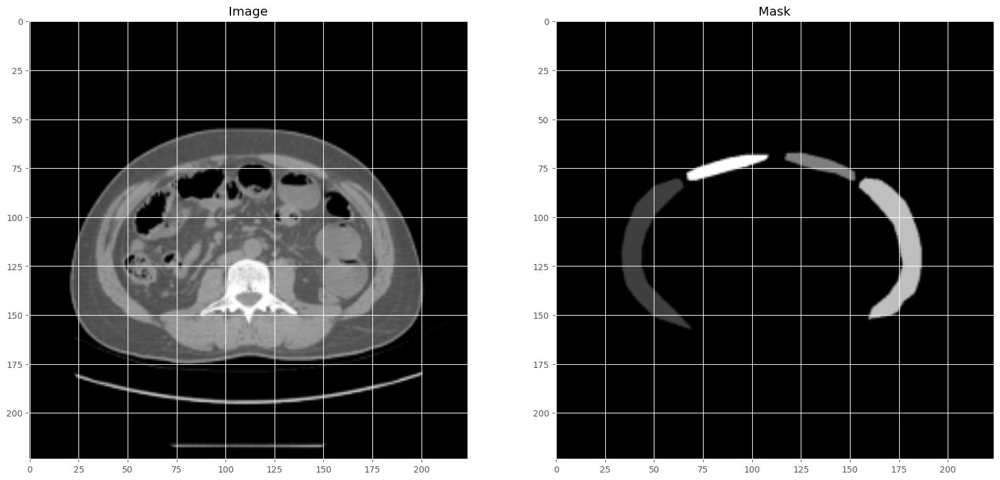

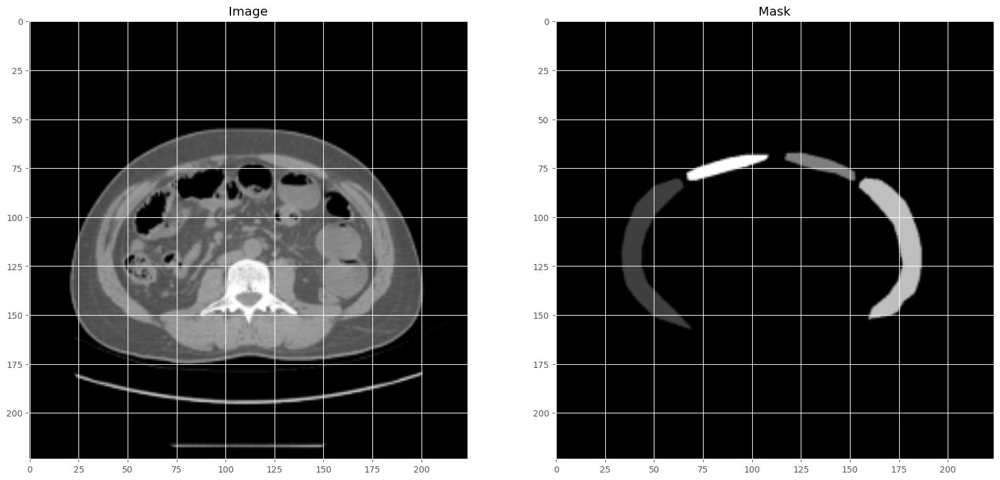

In [ ]:
from segmentation_models import Unet
pre_visualize(X_valid_VGG,y_valid, "Training")

In [ ]:
X_train

array([[[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 

In [ ]:
y_train.shape

(180, 224, 224, 1)

In [ ]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('seresnet34_UNet.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

results = model_Inc.fit(X_train_VGG, y_train, batch_size=16, epochs=80, callbacks=callbacks,\
                    validation_data=(X_valid_VGG, y_valid))




Epoch 1/80
12/12 [==============================] - ETA: 0s - loss: 0.7403 - accuracy: 0.8752
Epoch 1: val_loss improved from inf to 1.00000, saving model to seresnet34_UNet.h5
12/12 [==============================] - 49s 617ms/step - loss: 0.7403 - accuracy: 0.8752 - val_loss: 1.0000 - val_accuracy: 0.9393 - lr: 0.0010
Epoch 2/80
12/12 [==============================] - ETA: 0s - loss: 0.3371 - accuracy: 0.9412
Epoch 2: val_loss did not improve from 1.00000
12/12 [==============================] - 3s 240ms/step - loss: 0.3371 - accuracy: 0.9412 - val_loss: 1.0000 - val_accuracy: 0.9393 - lr: 0.0010
Epoch 3/80
12/12 [==============================] - ETA: 0s - loss: 0.1260 - accuracy: 0.9420
Epoch 3: val_loss did not improve from 1.00000
12/12 [==============================] - 3s 236ms/step - loss: 0.1260 - accuracy: 0.9420 - val_loss: 1.0000 - val_accuracy: 0.9393 - lr: 0.0010
Epoch 4/80
12/12 [==============================] - ETA: 0s - loss: 0.0661 - accuracy: 0.9421
Epoch 4: val_l

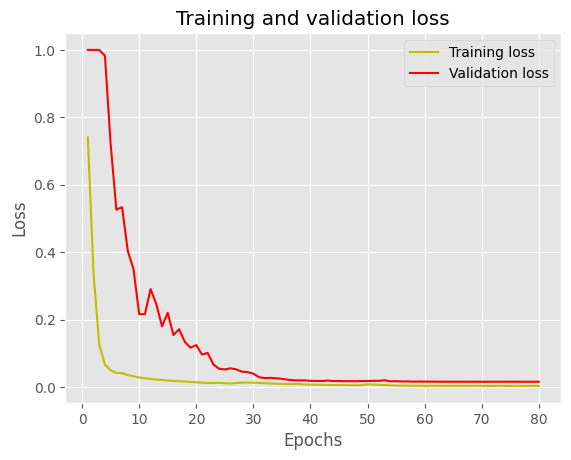

In [ ]:
#plot the training and validation accuracy and loss at each epoch
loss = results.history['loss']
val_loss = results.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()



In [ ]:
# load the best model
model_Inc.load_weights('seresnet34_UNet.h5')
#model1 = load_model('saved_models/res34_backbone_50epochs.hdf5', compile=False)

In [ ]:
# Evaluate on validation set (this must be equals to the best log_loss)
model_Inc.evaluate(X_train, y_train, verbose=1)
model_Inc.evaluate(X_valid, y_valid, verbose=1)
model_Inc.evaluate(X_test, y_test, verbose =1)
#model.evaluate(X_test, y_test, verbose=1)

1/1 [==============================] - 1s 1s/step - loss: 0.1522 - accuracy: 0.9427


[0.15218591690063477, 0.9426541924476624]

In [ ]:
# Predict on train, val and test
preds_train = model_Inc.predict(X_train, verbose=1)
#pred_train_argmax=np.argmax(preds_train, axis=3)

preds_val = model_Inc.predict(X_valid, verbose=1)
#pred_val_argmax=np.argmax(preds_val, axis=3)

preds_test = model_Inc.predict(X_test, verbose=1)
#pred_test_argmax=np.argmax(preds_test, axis=3)

#preds_test = model.predict(X_test, verbose=1)

1/1 [==============================] - 0s 39ms/step


In [ ]:
preds_train.shape

(180, 224, 224, 1)

In [ ]:
#Function for viewing plots and predictions
def plot_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 

  
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix],cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.2, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

						Training 


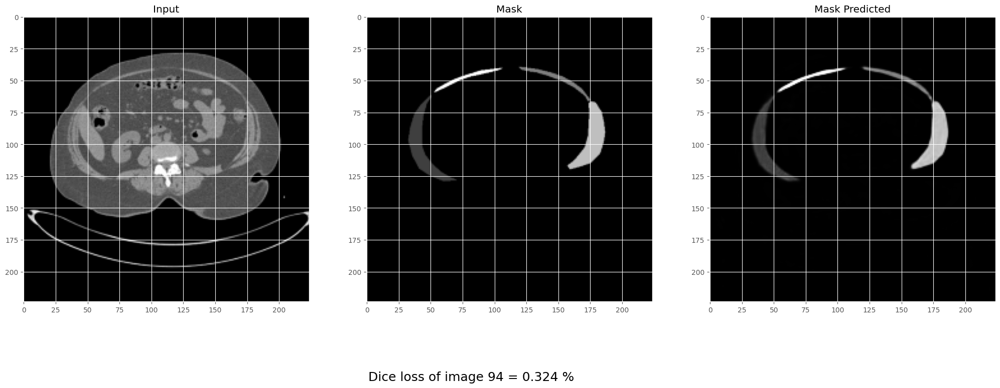

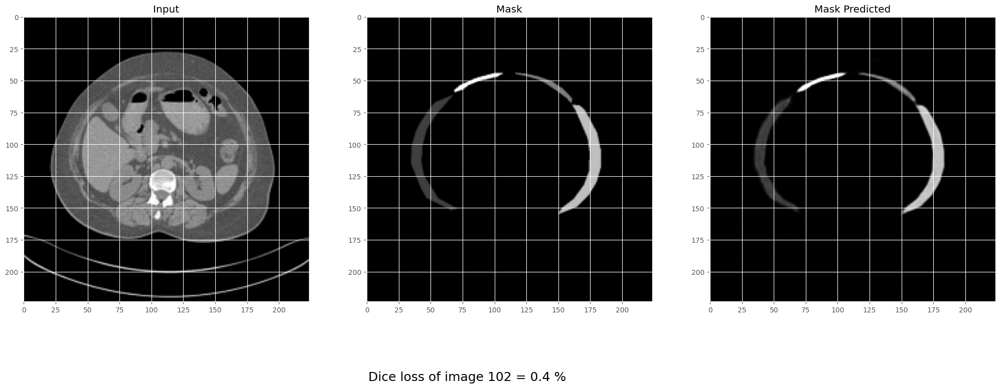

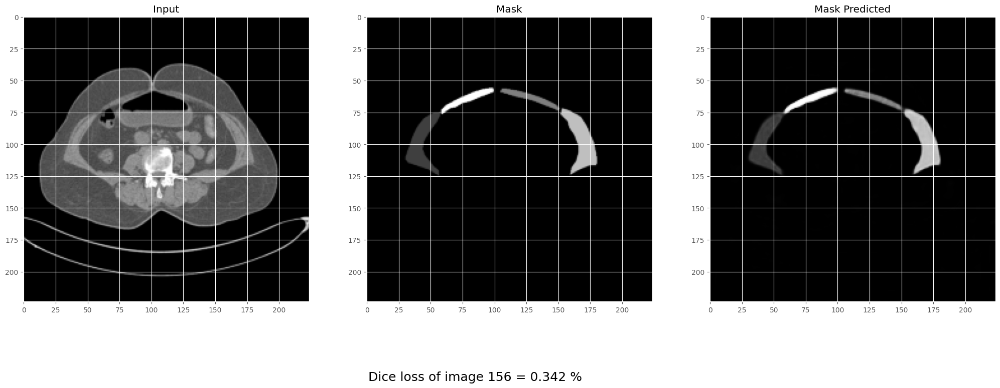

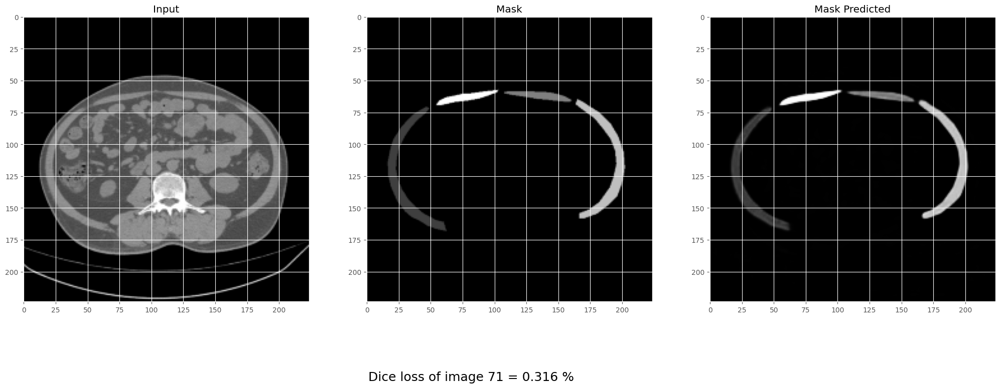

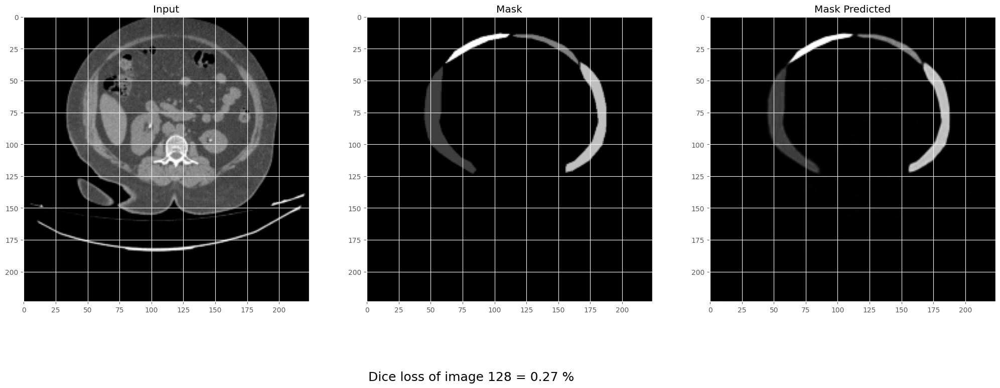

In [ ]:
plot_sample(X_train, y_train, preds_train, train_text)

						Validation 


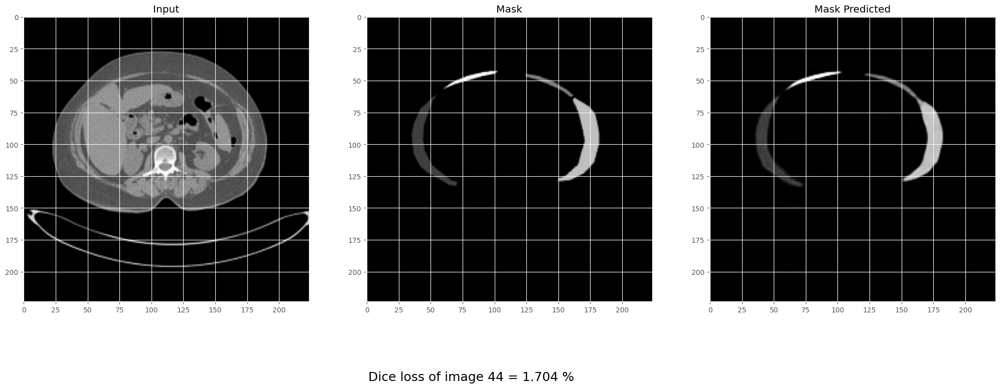

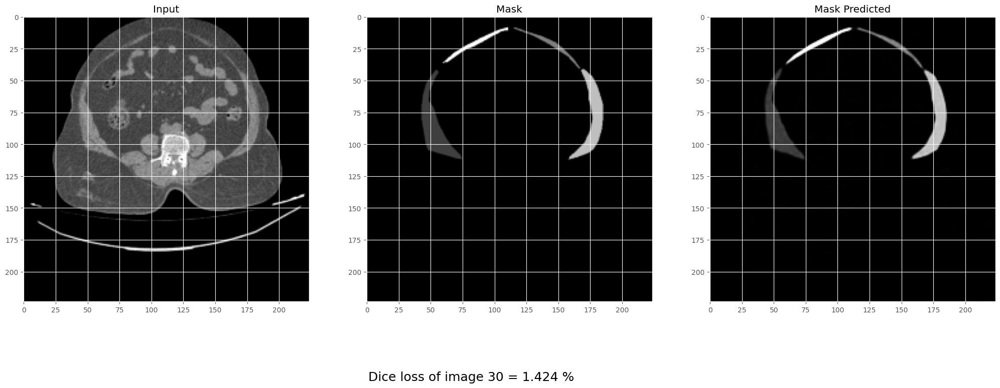

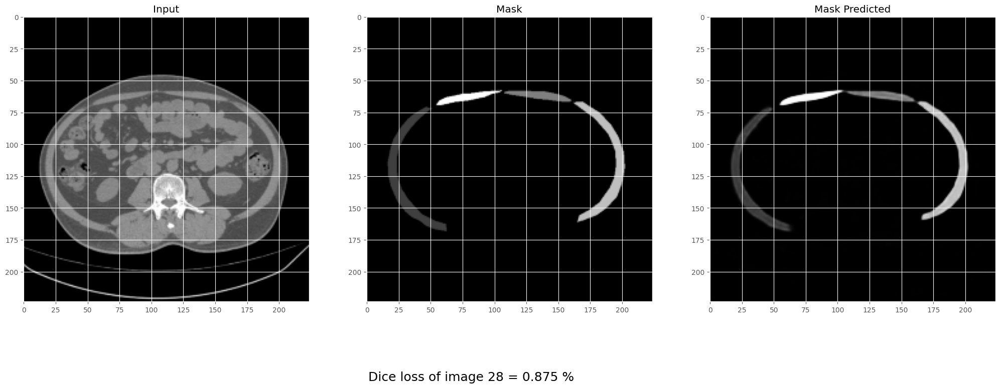

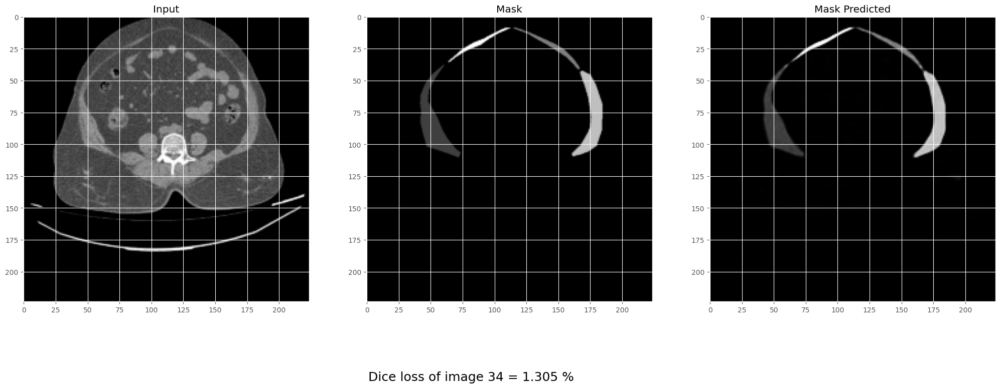

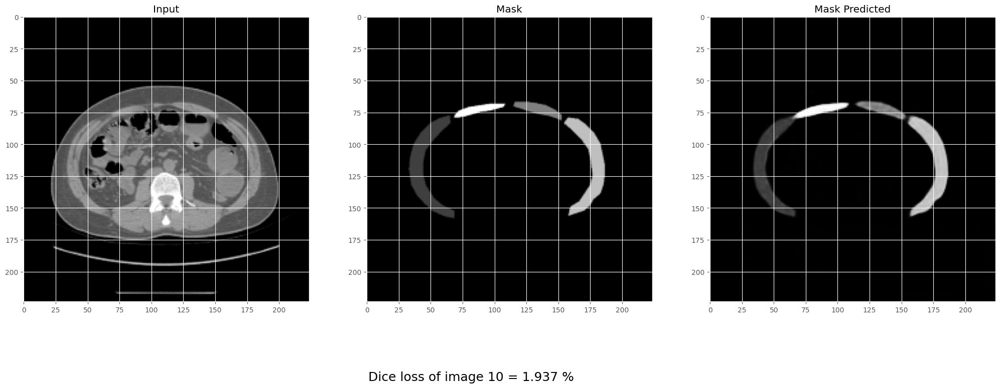

In [ ]:
plot_sample(X_valid, y_valid, preds_val, valid_text)

							Testing 


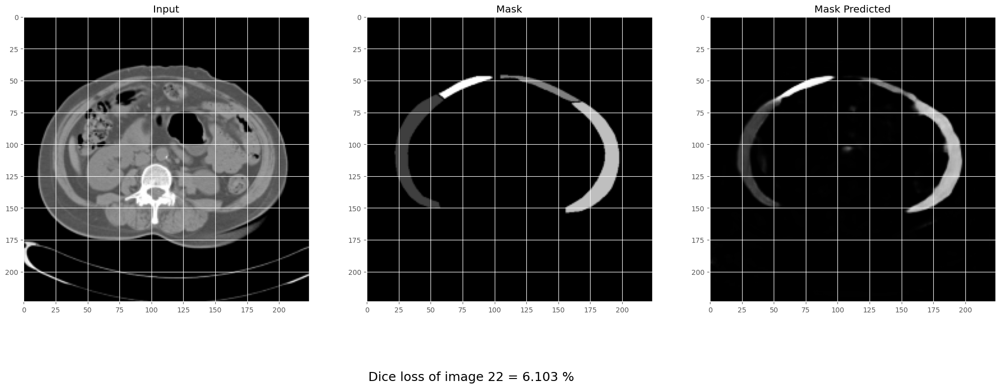

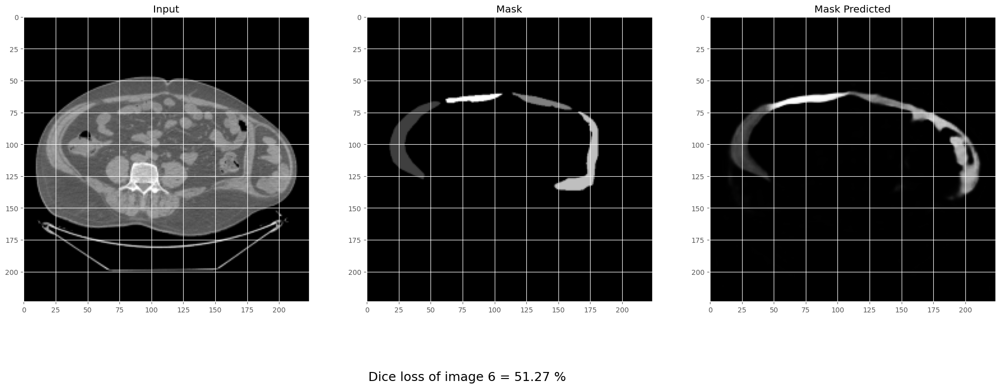

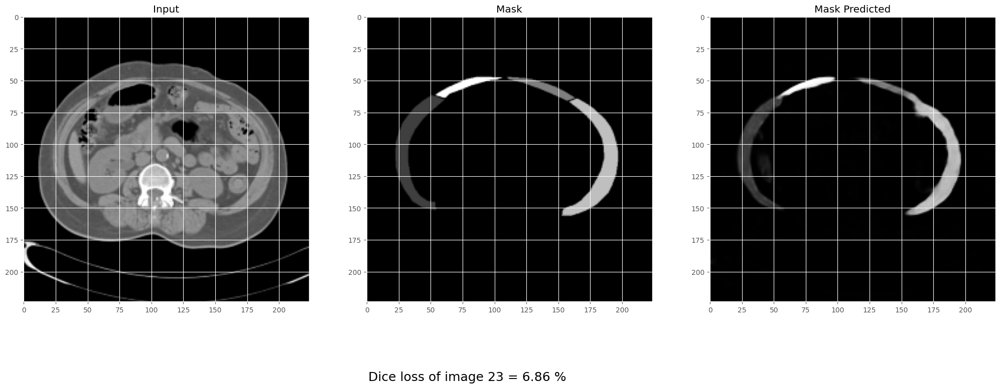

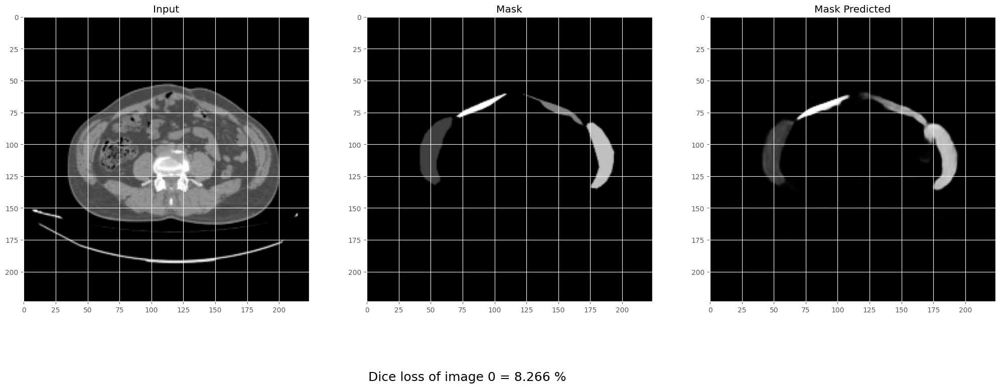

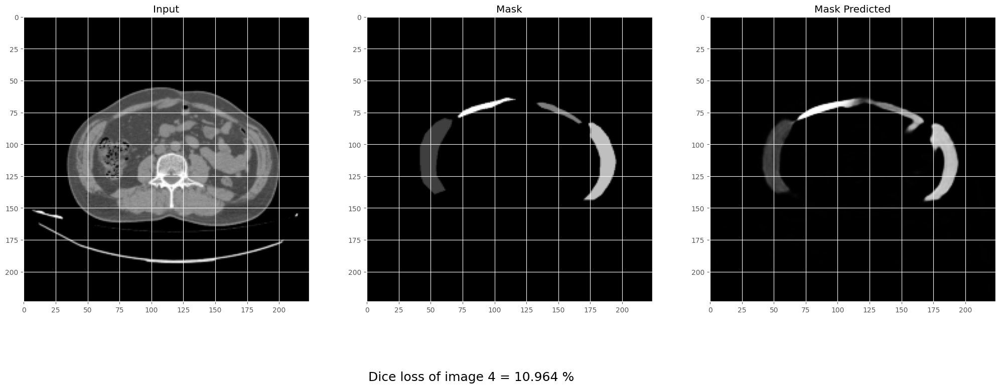

In [ ]:
plot_sample(X_test, y_test, preds_test, test_text)

In [ ]:
def avg_loss():
    d_loss_train = 0
    d_loss_valid = 0
    d_loss_test = 0

    temp = 0

    d_loss_train_list = []
    d_loss_valid_list = []
    d_loss_test_list = []
    
    for i in tqdm(range(0,len(X_train))):
        #temp = resize(preds_train[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_train = dice_loss(y_train[i],preds_train[i]).numpy()
        d_loss_train_list.append(d_loss_train)
        
    #d_loss_train_std = statistics.stdev(d_loss_train_list)
    #d_loss_train_avg = statistics.mean(d_loss_train_list)
    
    temp = 0
    
    
    for i in tqdm(range(0,len(X_valid))):
        #temp = resize(preds_val[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_valid = dice_loss(y_valid[i],preds_val[i]).numpy()
        d_loss_valid_list.append(d_loss_valid)
        
    temp = 0
    
    for i in tqdm(range(0,len(X_test))):
        #temp = resize(preds_test[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_test = dice_loss(y_test[i],preds_test[i]).numpy()
        d_loss_test_list.append(d_loss_test)
        
        

    #d_loss_valid_std = statistics.stdev(d_loss_valid_list)
    #d_loss_valid_avg = statistics.mean(d_loss_valid_list)
    return d_loss_train_list, d_loss_valid_list, d_loss_test_list
#d_loss_train_avg,d_loss_valid_avg,d_loss_train_std,d_loss_valid_std

In [ ]:
a,b,c = avg_loss() #List of training and validation values
print(len(a),len(b), len(c))

100%|██████████| 26/26 [00:00<00:00, 412.26it/s]

180 46 26


In [ ]:
case_1 = c[:5:]
case_5 = c[5:10:]
case_3 = c[10:15:]
case_4 = c[15:21:]
case_2 = c[21::]

In [ ]:
import statistics
print("Mean Dice loss of custom-100 U-Net for training: ",statistics.mean(a), " Max : ", max(a), "Min :", min(a))
print("Mean Dice loss of custom-100 U-Net for valid: ",statistics.mean(b), "Max : ", max(b), "Min : ", min(b))

Mean Dice loss of custom-100 U-Net for training:  0.0030784863  Max :  0.004721284 Min : 0.0022161007
Mean Dice loss of custom-100 U-Net for valid:  0.015335261 Max :  0.059335172 Min :  0.003990352


In [ ]:
print("Mean Dice loss of custom-100 U-Net for test-1: ",statistics.mean(case_1), "Max : ", max(case_1), "Min : ", min(case_1))
print("Mean Dice loss of custom-100 U-Net for test-2: ",statistics.mean(case_2), "Max : ", max(case_2), "Min : ", min(case_2))
print("Mean Dice loss of custom-100 U-Net for test-3: ",statistics.mean(case_3), "Max : ", max(case_3), "Min : ", min(case_3))
print("Mean Dice loss of custom-100 U-Net for test-4: ",statistics.mean(case_4), "Max : ", max(case_4), "Min : ", min(case_4))
print("Mean Dice loss of custom-100 U-Net for test-5: ",statistics.mean(case_5), "Max : ", max(case_5), "Min : ", min(case_5))

Mean Dice loss of custom-100 U-Net for test-1:  0.09462543 Max :  0.10964376 Min :  0.082660735
Mean Dice loss of custom-100 U-Net for test-2:  0.083208345 Max :  0.12074208 Min :  0.061026454
Mean Dice loss of custom-100 U-Net for test-3:  0.1159552 Max :  0.130256 Min :  0.088855565
Mean Dice loss of custom-100 U-Net for test-4:  0.07281809 Max :  0.092273474 Min :  0.0521847
Mean Dice loss of custom-100 U-Net for test-5:  0.4336544 Max :  0.512697 Min :  0.35913026


In [ ]:
case_1 = c[:5:]
case_2 = c[5:10:]
case_3 = c[10:15:]
case_4 = c[15:21:]
case_5 = c[21::]
import statistics
print("Mean Dice loss of Custom U-Net for training: ",statistics.mean(a), " Max : ", max(a), "Min :", min(a))
print("Mean Dice loss of Custom U-Net for valid: ",statistics.mean(b), "Max : ", max(b), "Min : ", min(b))
print("Mean Dice loss of Custom U-Net for test-1: ",statistics.mean(case_1), "Max : ", max(case_1), "Min : ", min(case_1))
print("Mean Dice loss of Custom U-Net for test-2: ",statistics.mean(case_5), "Max : ", max(case_5), "Min : ", min(case_5))
print("Mean Dice loss of Custom U-Net for test-3: ",statistics.mean(case_3), "Max : ", max(case_3), "Min : ", min(case_3))
print("Mean Dice loss of Custom U-Net for test-4: ",statistics.mean(case_4), "Max : ", max(case_4), "Min : ", min(case_4))

Mean Dice loss of Custom U-Net for training:  0.019876778  Max :  0.054958582 Min : 0.0102981925
Mean Dice loss of Custom U-Net for valid:  0.021791065 Max :  0.045727313 Min :  0.012680352
Mean Dice loss of Custom U-Net for test-1:  0.09859188 Max :  0.10761374 Min :  0.08527768
Mean Dice loss of Custom U-Net for test-2:  0.042545415 Max :  0.055865943 Min :  0.029500544
Mean Dice loss of Custom U-Net for test-3:  0.16049449 Max :  0.19188952 Min :  0.111709714
Mean Dice loss of Custom U-Net for test-4:  0.058891486 Max :  0.07940847 Min :  0.04626459


In [ ]:
test_folders

['SS_EA041', 'SS_EA002', 'SS_EA001', 'SS_EA025', 'SS_EA034']

In [ ]:
#Function for viewing plots and predictions
def final_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Complete loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.27, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

						Validation 


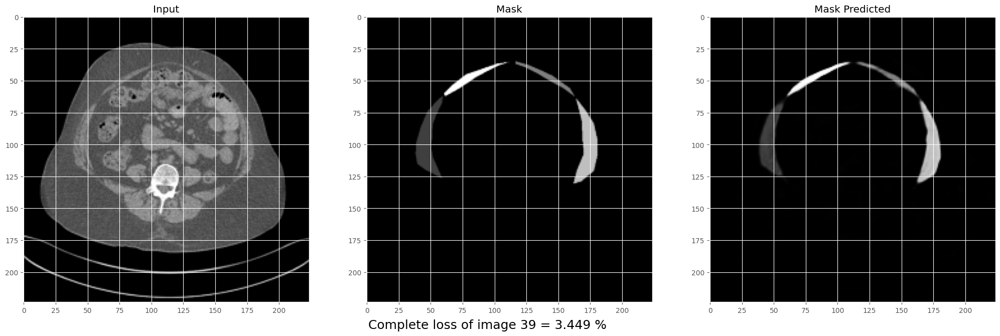

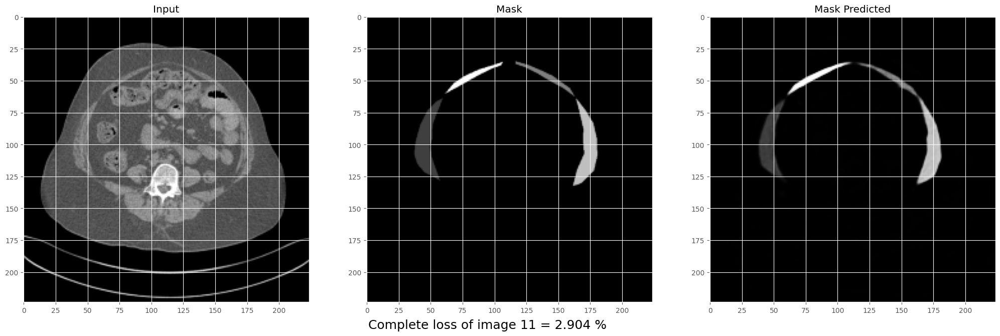

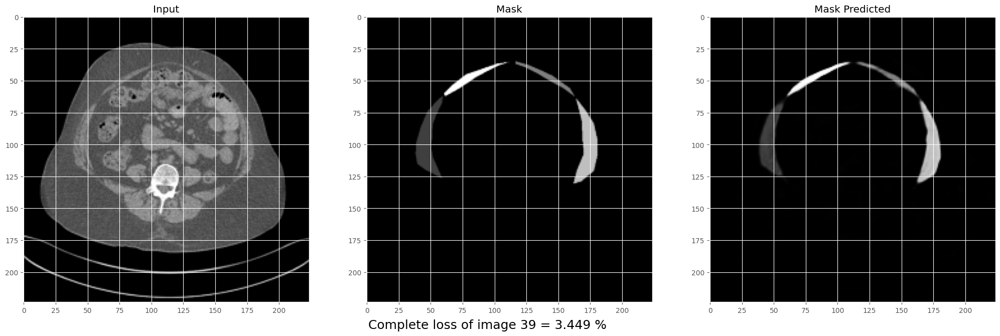

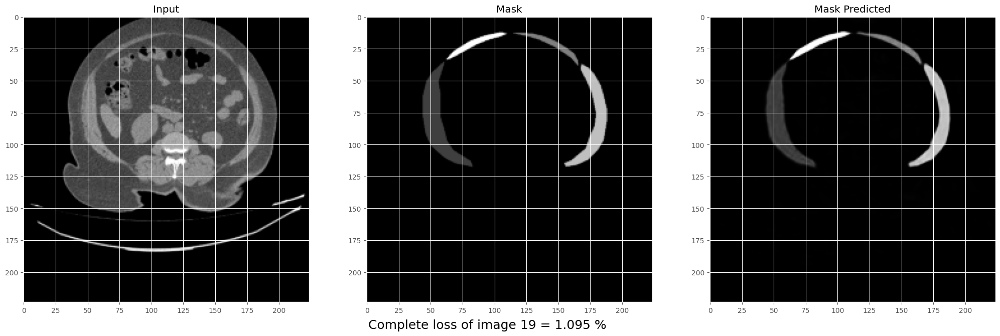

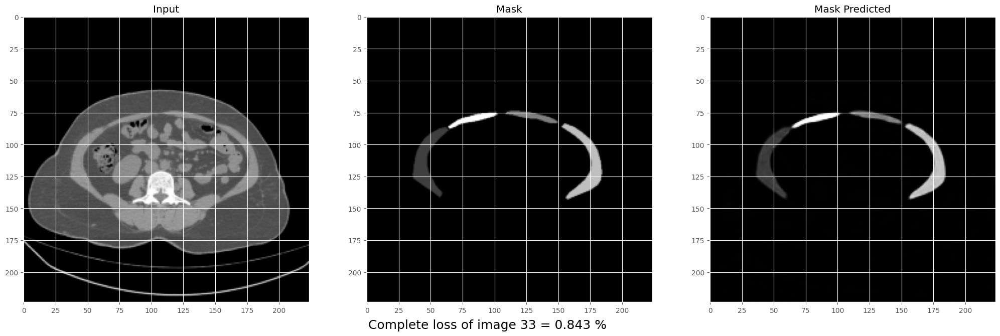

In [ ]:
final_sample(X_valid, y_valid, preds_val,valid_text)

In [ ]:
#Function for viewing plots and predictions
def test_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(len(X[:10])) : 
        ix = i
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.27, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

							Testing 


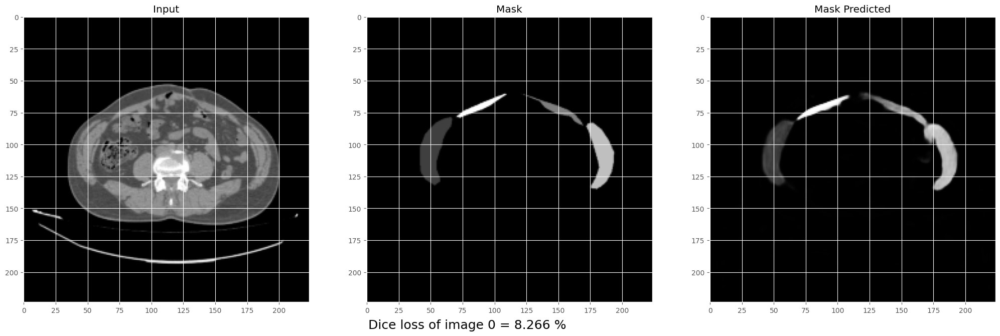

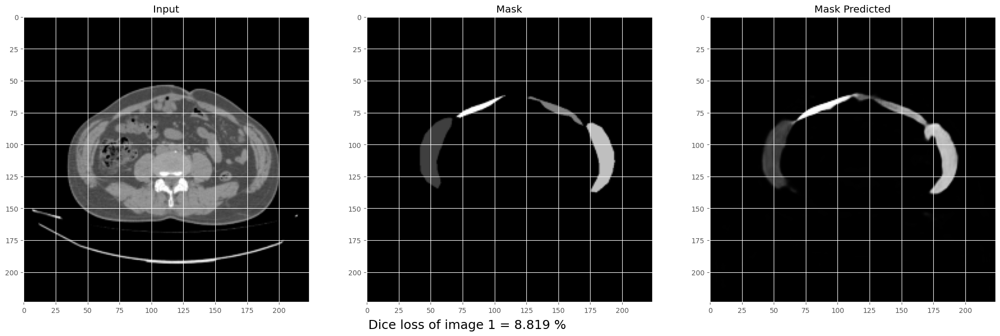

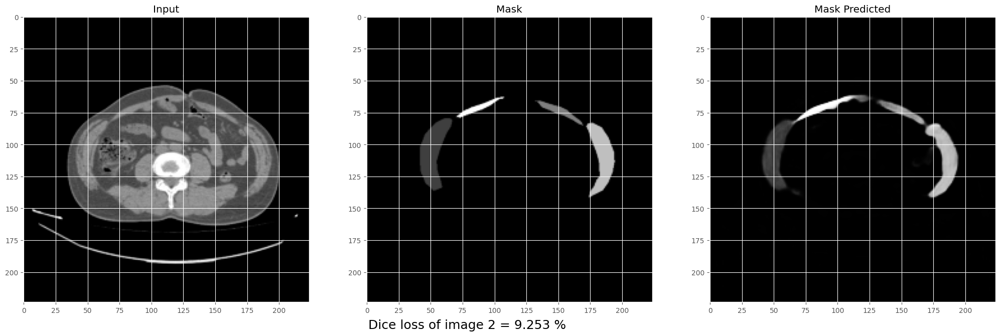

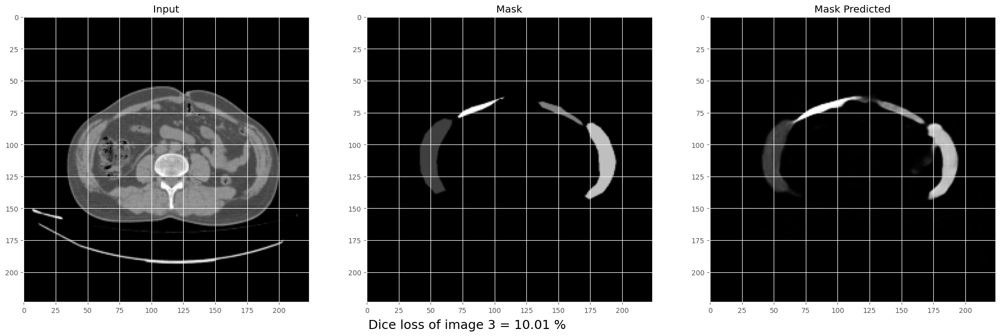

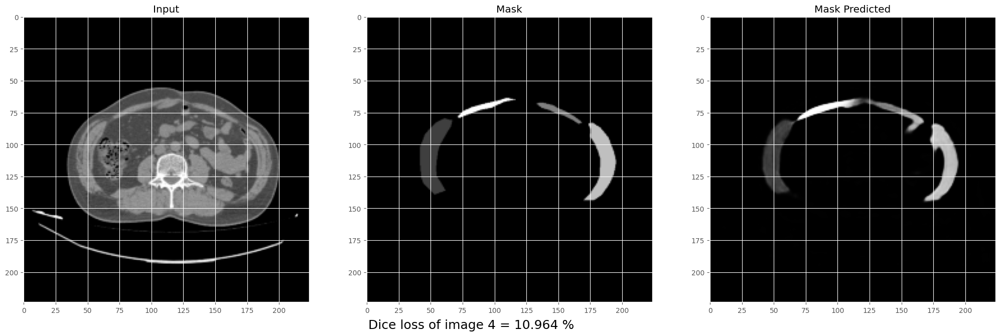

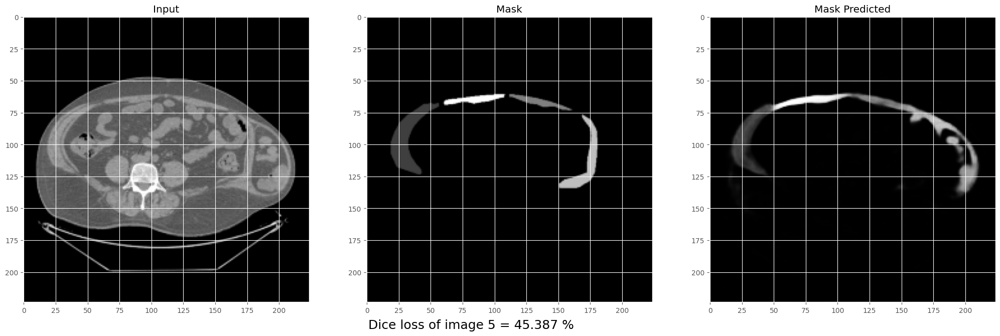

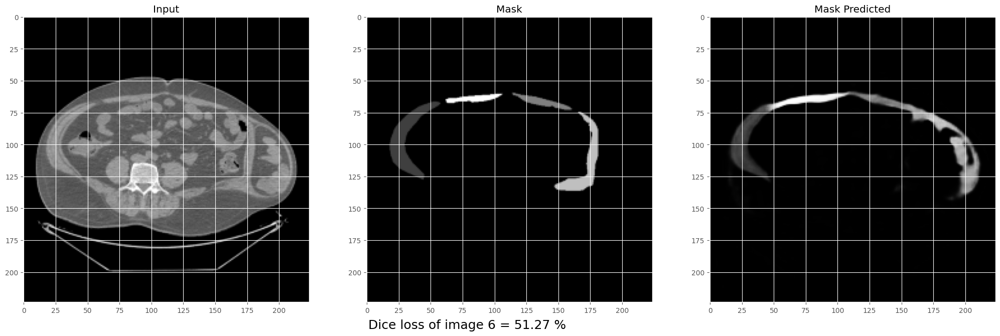

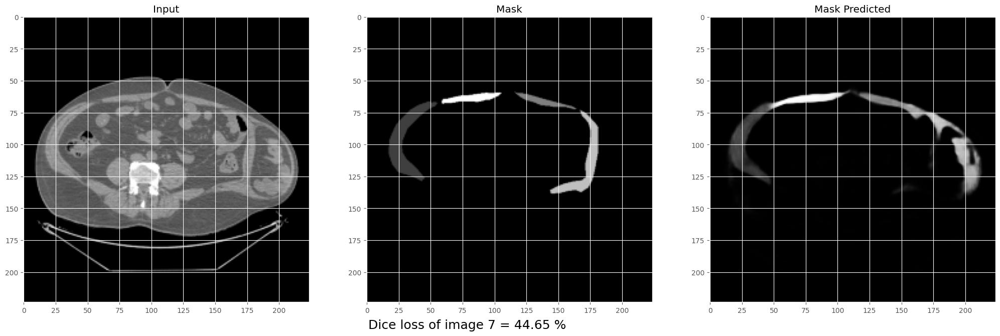

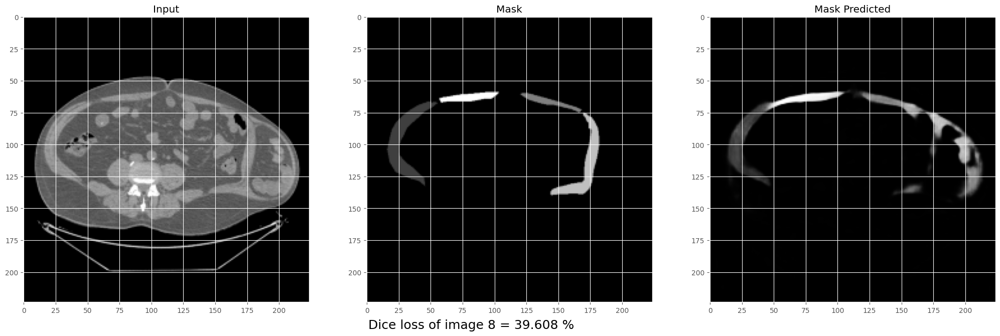

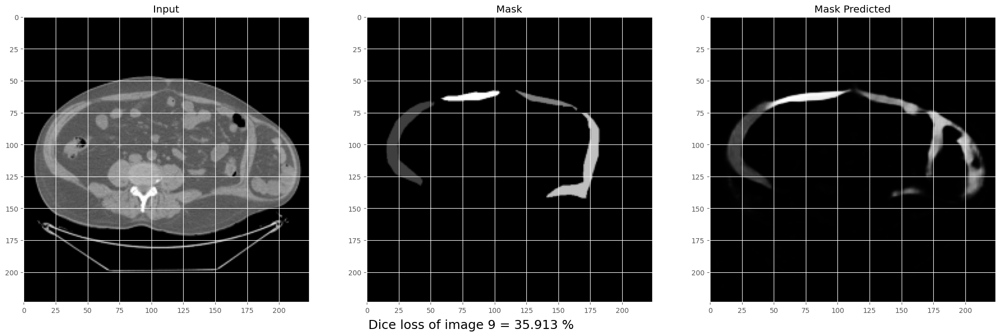

In [ ]:
test_sample(X_test, y_test, preds_test,test_text)